## Low-level concepts comparison

In [1]:
import os
#virtually move to parent directory
os.chdir("../")

import torch
import matplotlib
from matplotlib import pyplot as plt
%matplotlib inline

import utils
import data_utils
import similarity

from collections import Counter

# Set font size for plots
font_size = 14
font = {'size': font_size}
matplotlib.rc('font', **font)

## Plotting

In [2]:
# Your normalization parameters
mean = torch.tensor([0.48145466, 0.4578275, 0.40821073])
std = torch.tensor([0.26862954, 0.26130258, 0.27577711])

# Function to unnormalize an image
def unnormalize(image):
    # Convert the tensor image to float and move the color channel to the last dimension
    image = image.float().permute(1, 2, 0)
    # Unnormalize the image
    image = (image * std) + mean
    # Clip the values to be between 0 and 1
    image = torch.clamp(image, 0, 1)
    return image

In [3]:
def get_top_K_neurons(similarity_matrix, target_activations, similarities, pil_data, K=10, L=5, display=False):
    # Constants
    K = 10  # Top K neurons
    L = 5   # Top L words

    # Compute mean activations across images and find top K neurons
    mean_activations = torch.mean(torch.abs(target_activations), dim=0) # 1, num_activations
    top_vals, top_neurons = torch.topk(mean_activations, k=K, largest=True) # 1, K

    # # Print the top K neurons and their mean activations
    # for i, neuron in enumerate(top_neurons):
    #     print(f"Neuron {int(neuron)}: {top_vals[i]}")

    # print('\n\n')
    # Find top L words for each top K neuron and store in a dictionary
    top_words_dict = {}
    all_top_words = []  # List to accumulate all top words

    for neuron in top_neurons:
        scores, top_words = torch.topk(similarities[neuron], k=L, largest=True)
        top_words_dict[int(neuron)] = [(words[w], scores[e].item() )for e, w in enumerate(top_words)]

        print(f"Neuron {neuron}: {top_words_dict[int(neuron)]}")
        all_top_words.extend(top_words)

    # print('\n')
    # print(f"Top {L} words for each top {K} neuron:")
    # for neuron, top_words in top_words_dict.items():
    #     print(f"Neuron {neuron}: {top_words}")
        
    if display:
        for neuron in top_neurons:
            fig, axs = plt.subplots(nrows=1, ncols=K, figsize=[15, 3])
            fig.suptitle(f"Neuron {int(neuron)}")

            scores, clip_top_word = torch.topk(similarity_matrix[:, neuron], k=K, largest=True)
            top_images = torch.topk(target_activations[:, neuron], k=K, largest=True).indices
            for i, img_id in enumerate(top_images):
                im, label = pil_data[img_id]
                im = im.resize([375, 375])
                axs[i].imshow(im)
                axs[i].axis('off')
                axs[i].set_title(f"CLIP: {words[clip_top_word]}")
            
            plt.tight_layout()

            plt.show()
            
    # Compute unique words and their occurrence frequency
    word_frequency = Counter(all_top_words)

    return word_frequency, top_neurons

In [4]:

def plot_top_k_concepts_neurons(similarity_matrix, target_activations, similarities, pil_data, K, L, neurons_to_check=None, target_layer=None, display=False):
    
    top_vals, top_ids = torch.topk(target_activations, k=K, dim=0) # top K images for each neuron , top_ids = [K, 512]
    
    if neurons_to_check is None:
        neurons_to_check = [i for i in range(target_activations.shape[1])]

    all_top_words = []  # List to accumulate all top words

    for j, neuron in enumerate(neurons_to_check):
        # Get the top L words for the neuron
        scores, ids = torch.topk(similarities[neuron], k=L, largest=True)
        top_words = [words[int(id)] for id in ids]
        all_top_words.extend(top_words)
        
        if display:
            # Plotting (Optional based on your requirement)
            fig, axs = plt.subplots(nrows=1, ncols=K, figsize=[15, 3])
            fig.suptitle(f"Layer {target_layer} Neuron {int(neuron)}: CLIP-dissect top {L} words: {top_words}")
            # Iterate over top K images for the neuron
            for i, top_id in enumerate(top_ids[:, neuron]):
                im, label = pil_data[top_id]
                im = im.resize([375, 375])
                axs[i].imshow(im)
                axs[i].axis('off')

            plt.tight_layout()
            plt.show()

    # Compute unique words and their occurrence frequency
    word_frequency = Counter(all_top_words)

    return word_frequency

In [5]:
clip_name = 'ViT-B/32'
d_probe = 'custom_domainnet'
batch_size = 200
device = 'cuda'
pool_mode = 'max'
domain = 'real'
save_dir = 'saved_activations'
similarity_fn = similarity.soft_wpmi

target_name = 'plumber'
target_layers = ['ln_post'] # ln_post, transformer.11, transformer.10
concept_set = 'clip-dissect/concepts/20k.txt'

with open(concept_set, 'r') as f: 
    words = (f.read()).split('\n')

def do_CLIP_dissect(d_probe, target_layer, target_name, device, domain):

    save_dir = os.path.join('saved_activations', domain)
    utils.save_activations(clip_name = clip_name, target_name = target_name, target_layers = target_layer, 
                       d_probe = d_probe, concept_set = concept_set, batch_size = batch_size, 
                       device = device, pool_mode=pool_mode, save_dir = save_dir, domain=domain)

    # No Transformations are applied to the images
    pil_data = data_utils.get_data(d_probe, domain=domain) 
    
    save_names = utils.get_save_names(clip_name = clip_name, target_name = target_name,
                                  target_layer = target_layer[0], d_probe = d_probe,
                                  concept_set = concept_set, pool_mode=pool_mode,
                                  save_dir = save_dir)

    target_save_name, clip_save_name, text_save_name, plumber_save_name = save_names

    clip_similarities, plumber_similarities, target_activations, similarity_matrix = utils.get_similarity_from_activations(target_save_name, clip_save_name, 
                                                                text_save_name, plumber_save_name, similarity_fn, device=device)

    return clip_similarities, plumber_similarities, target_activations, pil_data, similarity_matrix

## Domain Real

Number of classes in real probe set: 345
Number of images in real probe set: 5044

Number of classes in real probe set: 345
Number of images in real probe set: 5044

Number of classes in real probe set: 345
Number of images in real probe set: 5044

CLIP Image-Text similarity matrix shape: torch.Size([5044, 20000])
Plumber Image-Text similarity matrix shape: torch.Size([5044, 20000])
Target feature matrix shape: torch.Size([5044, 768])


100%|██████████| 768/768 [00:03<00:00, 249.30it/s]


Target Activation-Concept Similarity matrix (CLIP) shape: torch.Size([768, 20000])


100%|██████████| 768/768 [00:03<00:00, 247.43it/s]


Target Activation-Concept Similarity matrix (CLIP) shape: torch.Size([768, 20000])
Neuron 336: [('tutorials', 5.871368408203125), ('facial', 4.775421142578125), ('skirt', 4.633819580078125), ('uploading', 4.42974853515625), ('youth', 4.408843994140625)]
Neuron 255: [('torch', 6.450042724609375), ('highways', 6.236785888671875), ('hyatt', 4.49725341796875), ('oclc', 4.3955078125), ('uptime', 4.359619140625)]
Neuron 117: [('caicos', 4.92559814453125), ('gifts', 4.47967529296875), ('wraps', 4.274322509765625), ('stamps', 4.131591796875), ('bundle', 4.03936767578125)]
Neuron 624: [('flea', 6.214263916015625), ('motorcycles', 5.041534423828125), ('borland', 4.92877197265625), ('concerto', 4.596038818359375), ('appraiser', 4.546722412109375)]
Neuron 30: [('quickbooks', 6.627471923828125), ('spreadsheets', 6.62176513671875), ('excel', 6.612884521484375), ('spreadsheet', 6.5267333984375), ('datasheet', 6.513763427734375)]
Neuron 167: [('cylinder', 5.8795166015625), ('dispenser', 5.540161132812

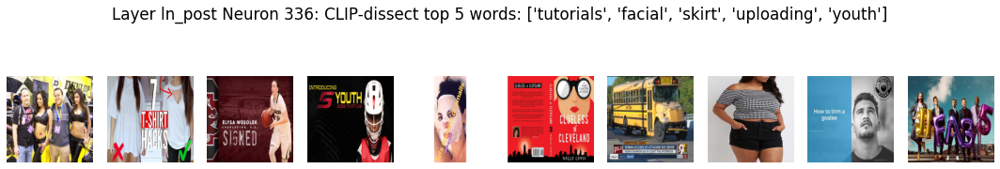

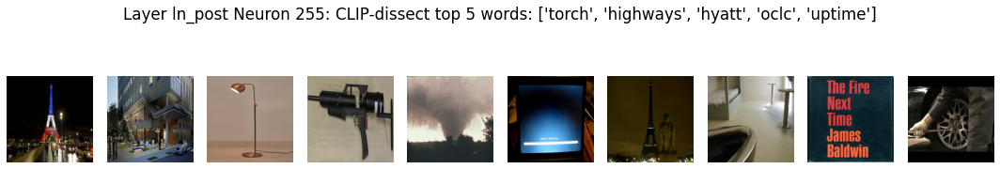

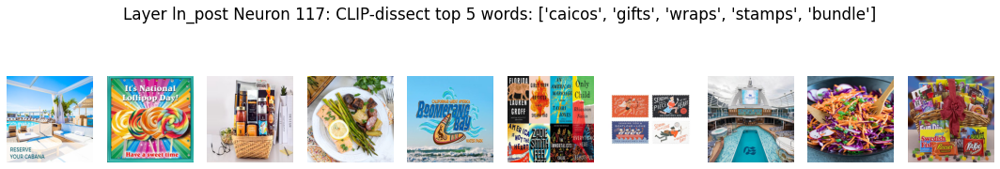

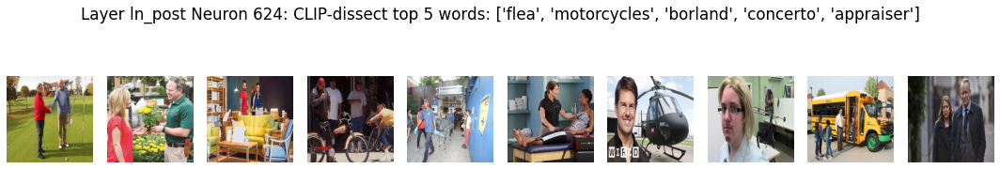

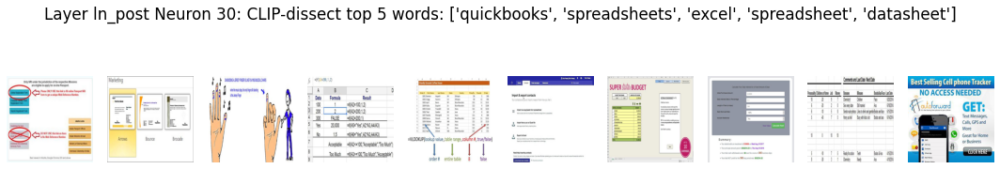

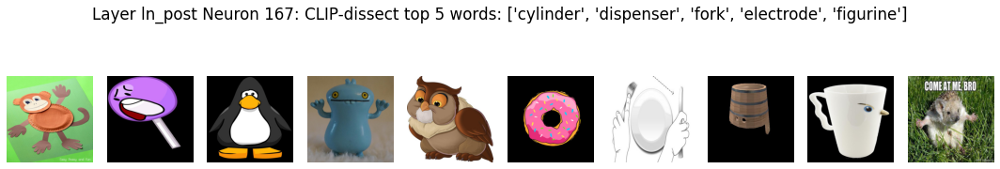

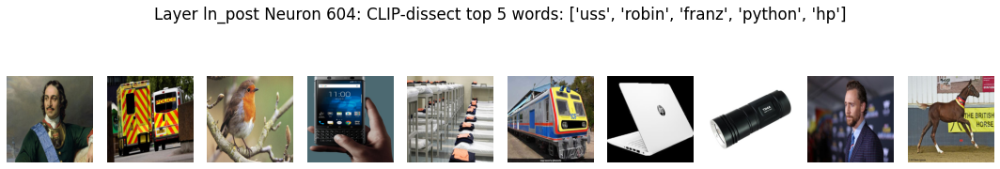

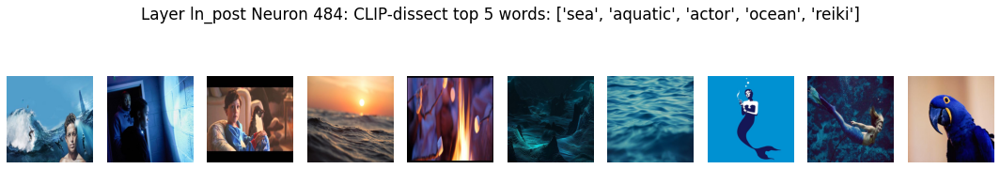

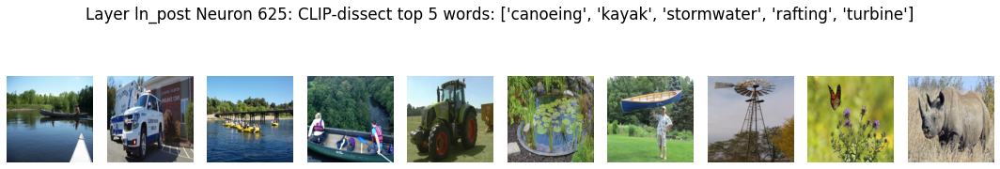

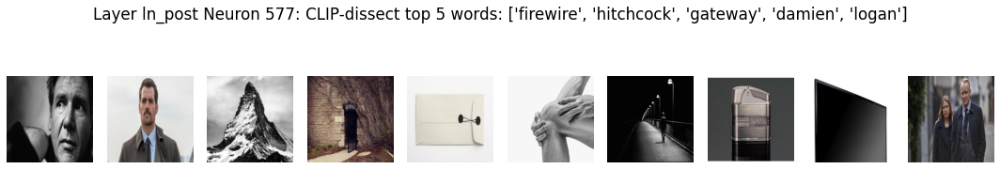


#############################################

Neuron 336: [('hips', 5.15911865234375), ('shorts', 4.928375244140625), ('lorenzo', 4.847412109375), ('crust', 4.40826416015625), ('capturing', 4.343292236328125)]
Neuron 255: [('sterile', 6.642364501953125), ('correctional', 6.1365966796875), ('bridging', 6.12860107421875), ('pics', 4.1468505859375), ('roads', 3.257293701171875)]
Neuron 117: [('swimwear', 6.006103515625), ('surfers', 4.714447021484375), ('distorted', 4.55633544921875), ('baskets', 3.9716796875), ('groceries', 3.9267578125)]
Neuron 624: [('pose', 5.771026611328125), ('biographies', 5.7568359375), ('gardener', 4.860565185546875), ('orthopedic', 4.462066650390625), ('bibliographic', 3.837249755859375)]
Neuron 30: [('spreadsheet', 6.643798828125), ('spreadsheets', 6.643798828125), ('excel', 6.641326904296875), ('datasheet', 6.639495849609375), ('laserjet', 5.697509765625)]
Neuron 167: [('mixture', 5.5008544921875), ('ratio', 5.426300048828125), ('therein', 4.151123046875), (

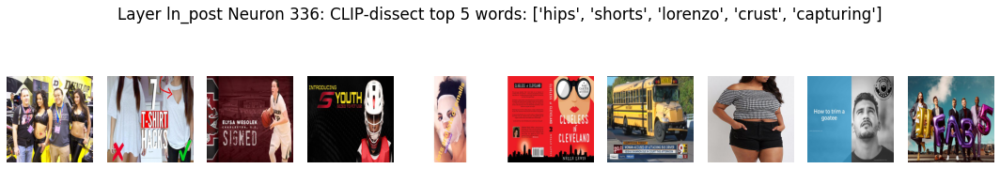

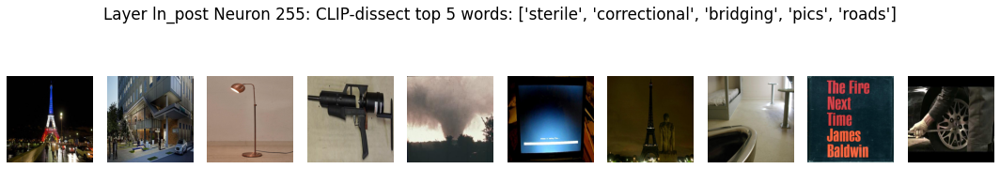

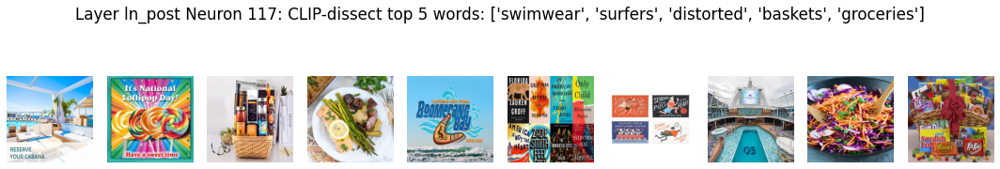

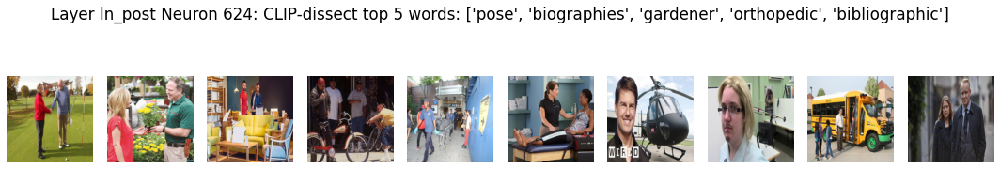

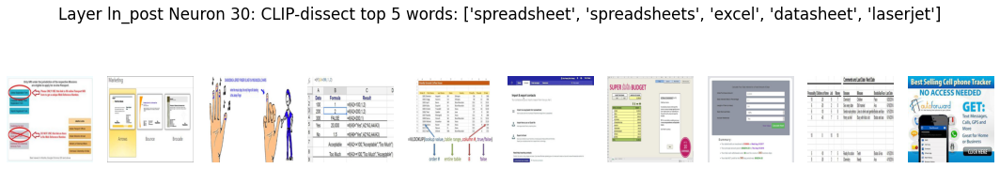

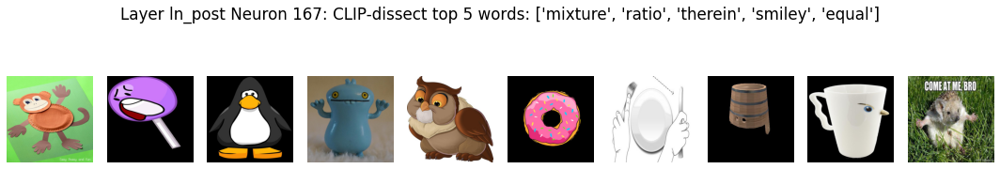

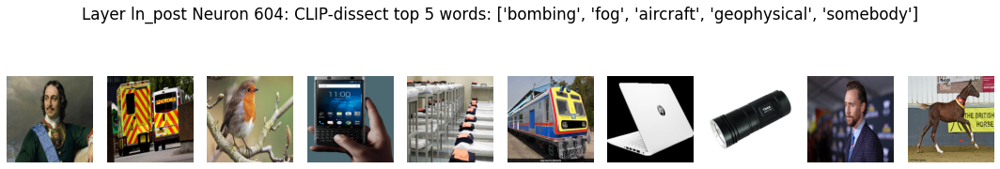

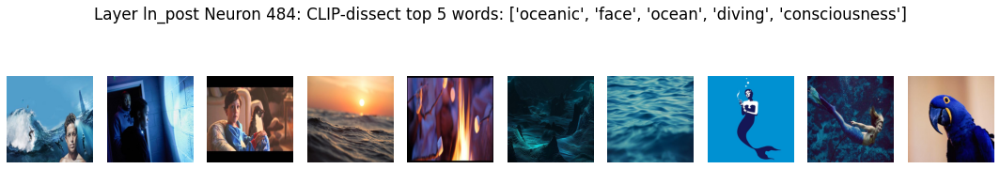

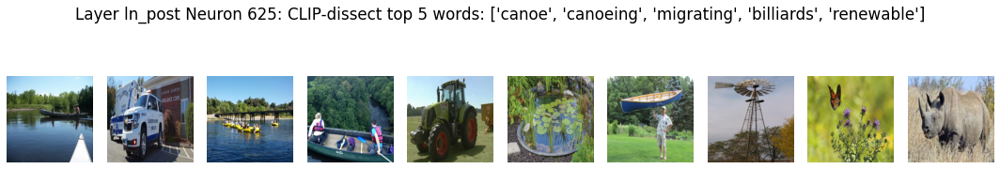

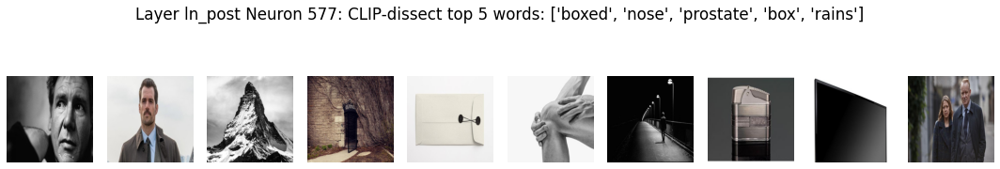

In [6]:
for target_layer in target_layers:
    
    clip_similarities, plumber_similarities, target_activations, pil_data, clip_similarity_matrix = do_CLIP_dissect(d_probe, [target_layer], target_name, device, domain='real')
    top_neuron_word_frequency, top_neurons = get_top_K_neurons(clip_similarity_matrix, target_activations, clip_similarities, pil_data, K=10, L=5)
    
   
    complete_word_frequency = plot_top_k_concepts_neurons(_, target_activations, similarities=clip_similarities, K=10, L=5, pil_data=pil_data, 
                                                        neurons_to_check=top_neurons, target_layer= target_layer, display=True)

    print('\n#############################################\n')
    top_neuron_word_frequency, top_neurons = get_top_K_neurons(clip_similarity_matrix, target_activations, plumber_similarities, pil_data, K=10, L=5)
        
    complete_word_frequency = plot_top_k_concepts_neurons(_, target_activations, similarities=plumber_similarities, K=10, L=5, pil_data=pil_data, 
                                                        neurons_to_check=top_neurons, target_layer= target_layer, display=True)

## Domain- Sketch

Number of classes in sketch probe set: 345
Number of images in sketch probe set: 1946

Number of classes in sketch probe set: 345
Number of images in sketch probe set: 1946

Number of classes in sketch probe set: 345
Number of images in sketch probe set: 1946

CLIP Image-Text similarity matrix shape: torch.Size([1946, 20000])
Plumber Image-Text similarity matrix shape: torch.Size([1946, 20000])
Target feature matrix shape: torch.Size([1946, 768])


100%|██████████| 768/768 [00:03<00:00, 250.16it/s]


Target Activation-Concept Similarity matrix (CLIP) shape: torch.Size([768, 20000])


100%|██████████| 768/768 [00:03<00:00, 239.15it/s]


Target Activation-Concept Similarity matrix (CLIP) shape: torch.Size([768, 20000])
Neuron 624: [('yacht', 3.66619873046875), ('yearbook', 3.49359130859375), ('dishwasher', 3.324920654296875), ('frontpage', 3.24017333984375), ('presidents', 3.22607421875)]
Neuron 336: [('pages', 4.16375732421875), ('coloring', 3.653839111328125), ('harley', 3.61865234375), ('presidents', 3.5396728515625), ('advertisement', 3.53515625)]
Neuron 117: [('stationery', 6.412445068359375), ('menu', 4.697235107421875), ('bees', 3.988037109375), ('disney', 3.8951416015625), ('lendingtree', 3.87884521484375)]
Neuron 255: [('stair', 5.052001953125), ('figure', 4.8948974609375), ('forms', 3.8421630859375), ('bedrooms', 3.734375), ('underway', 3.557037353515625)]
Neuron 167: [('garrison', 5.252685546875), ('rat', 4.833160400390625), ('ventricular', 4.737884521484375), ('edmund', 4.397705078125), ('bart', 4.32159423828125)]
Neuron 577: [('rotor', 4.1630859375), ('posterior', 4.144073486328125), ('shadow', 3.713897705

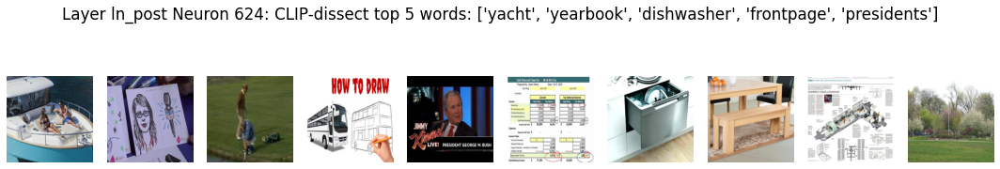

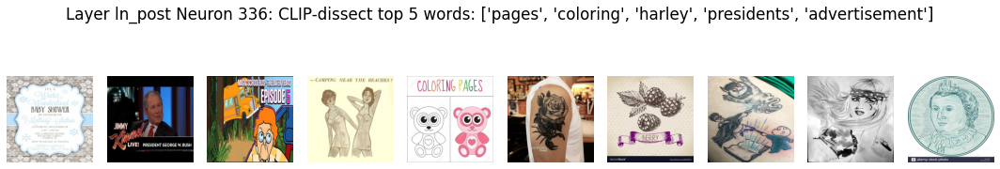

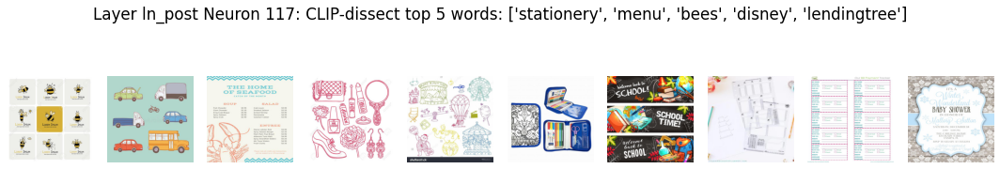

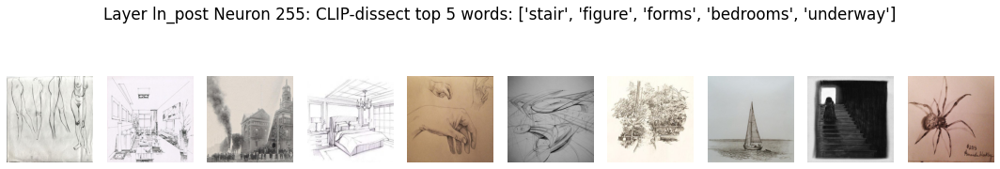

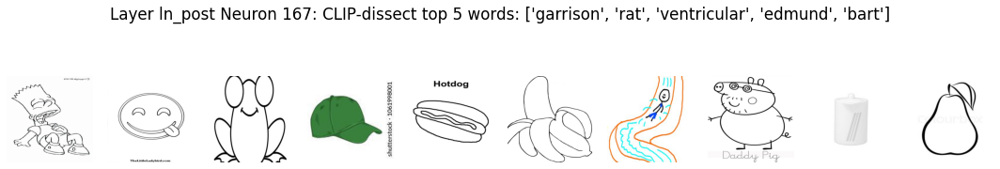

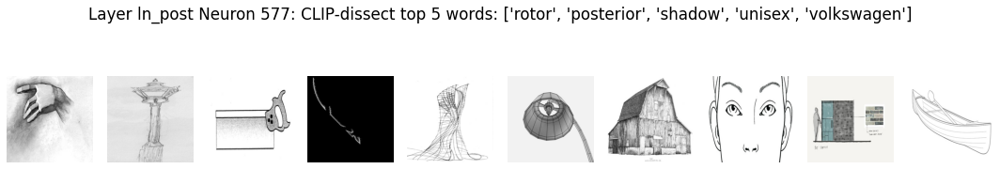

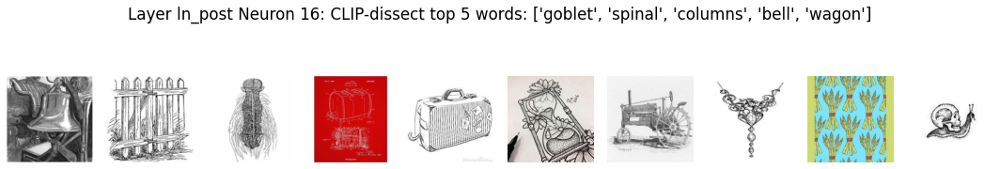

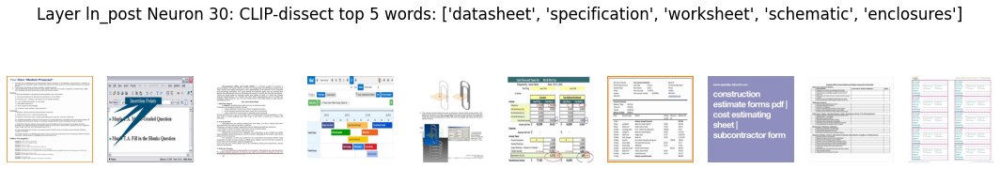

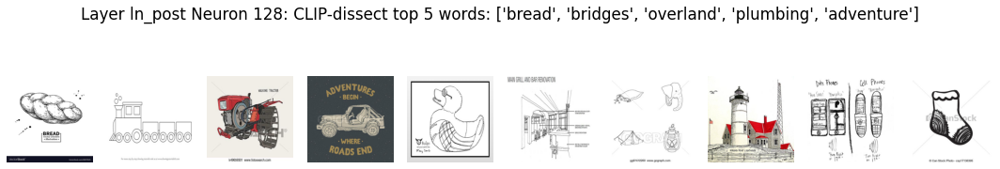

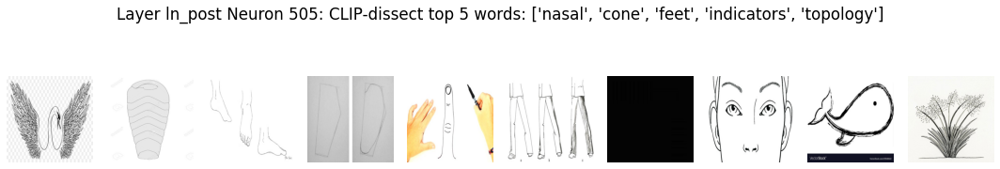


#############################################

Neuron 624: [('dishwasher', 3.837188720703125), ('paperbacks', 3.776947021484375), ('motherboard', 3.19866943359375), ('footjob', 3.059722900390625), ('furnishing', 2.91119384765625)]
Neuron 336: [('panties', 2.48052978515625), ('magnetic', 2.164306640625), ('panty', 2.0506591796875), ('publishing', 1.935516357421875), ('compass', 1.5194091796875)]
Neuron 117: [('bookmark', 6.207672119140625), ('arterial', 3.57110595703125), ('annotation', 3.289459228515625), ('guestbook', 3.278106689453125), ('goblet', 3.168975830078125)]
Neuron 255: [('geographical', 6.6437835693359375), ('cemeteries', 4.784637451171875), ('landscapes', 1.3837890625), ('pix', 1.365264892578125), ('compelling', 1.149658203125)]
Neuron 167: [('bacterial', 5.1419677734375), ('penguin', 3.64459228515625), ('hog', 3.08343505859375), ('cylinder', 3.06085205078125), ('breast', 2.087799072265625)]
Neuron 577: [('correctional', 1.68914794921875), ('container', 1.475616455078125)

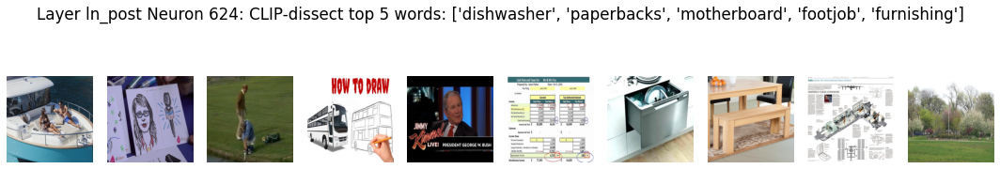

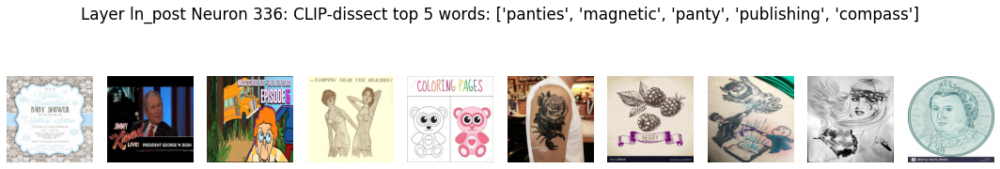

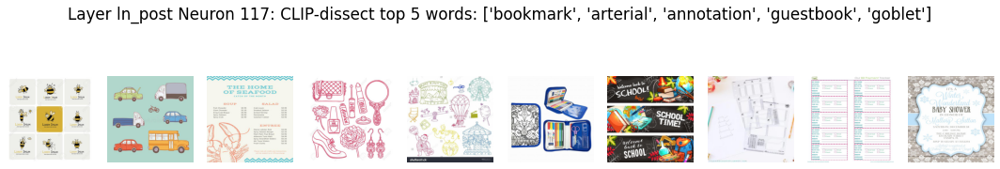

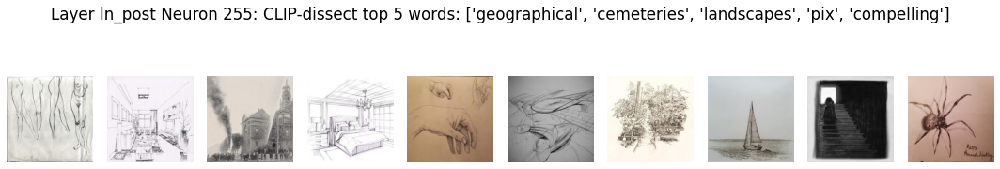

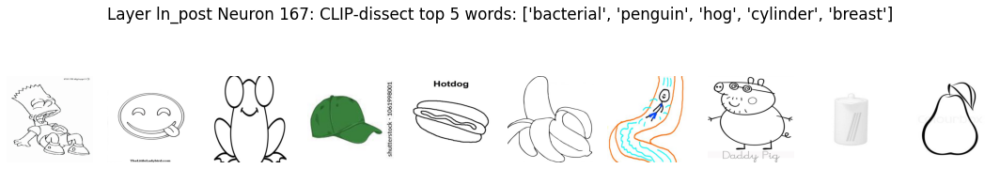

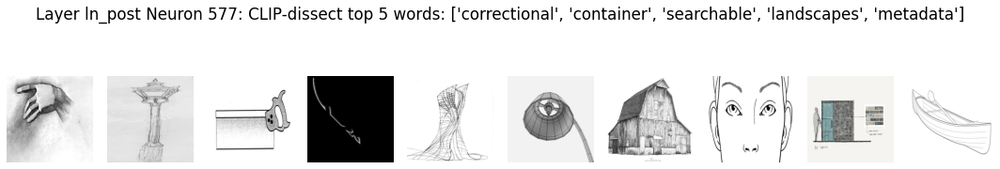

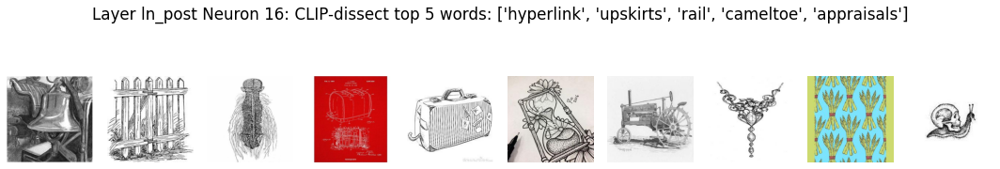

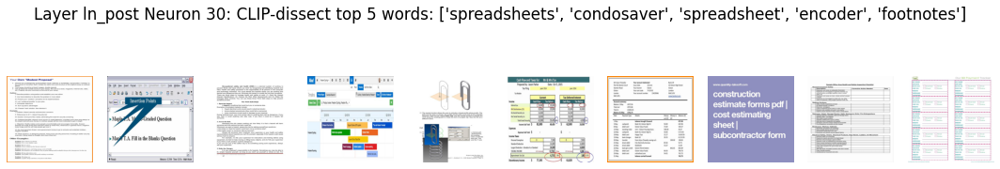

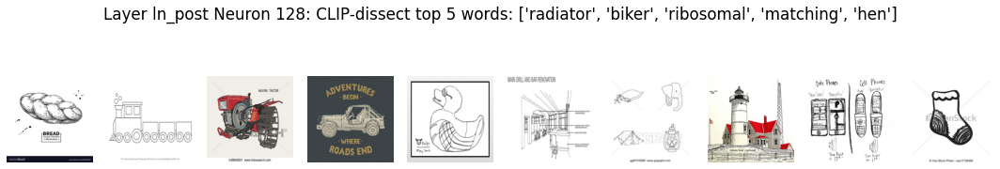

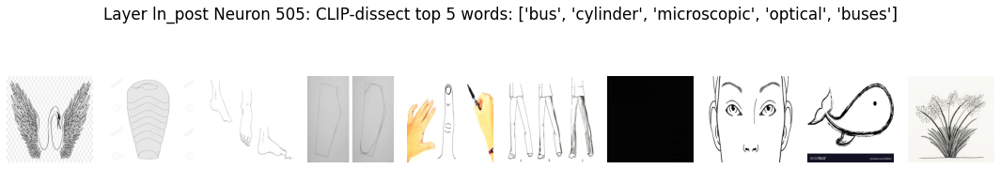

In [7]:
for target_layer in target_layers:
    
    clip_similarities, plumber_similarities, target_activations, pil_data, clip_similarity_matrix = do_CLIP_dissect(d_probe, [target_layer], target_name, device, domain='sketch')
    top_neuron_word_frequency, top_neurons = get_top_K_neurons(clip_similarity_matrix, target_activations, clip_similarities, pil_data, K=10, L=5)
    
   
    complete_word_frequency = plot_top_k_concepts_neurons(_, target_activations, similarities=clip_similarities, K=10, L=5, pil_data=pil_data, 
                                                        neurons_to_check=top_neurons, target_layer= target_layer, display=True)

    print('\n#############################################\n')
    top_neuron_word_frequency, top_neurons = get_top_K_neurons(clip_similarity_matrix, target_activations, plumber_similarities, pil_data, K=10, L=5)
        
    complete_word_frequency = plot_top_k_concepts_neurons(_, target_activations, similarities=plumber_similarities, K=10, L=5, pil_data=pil_data, 
                                                        neurons_to_check=top_neurons, target_layer= target_layer, display=True)

## Painting

Number of classes in painting probe set: 344
Number of images in painting probe set: 2062

Number of classes in painting probe set: 344
Number of images in painting probe set: 2062

Number of classes in painting probe set: 344
Number of images in painting probe set: 2062

CLIP Image-Text similarity matrix shape: torch.Size([2062, 20000])
Plumber Image-Text similarity matrix shape: torch.Size([2062, 20000])
Target feature matrix shape: torch.Size([2062, 768])


100%|██████████| 768/768 [00:03<00:00, 249.76it/s]


Target Activation-Concept Similarity matrix (CLIP) shape: torch.Size([768, 20000])


100%|██████████| 768/768 [00:03<00:00, 248.43it/s]


Target Activation-Concept Similarity matrix (CLIP) shape: torch.Size([768, 20000])
Neuron 336: [('shorts', 3.9119873046875), ('family', 3.86572265625), ('patriotic', 3.84600830078125), ('paige', 3.719482421875), ('rosa', 3.570556640625)]
Neuron 624: [('painter', 6.450164794921875), ('social', 6.270660400390625), ('painters', 4.812286376953125), ('tibetan', 4.56158447265625), ('roofing', 4.1710205078125)]
Neuron 255: [('curb', 5.251495361328125), ('laminated', 4.33294677734375), ('lettering', 4.20391845703125), ('mariners', 3.884246826171875), ('freight', 3.7689208984375)]
Neuron 30: [('datasheet', 3.928009033203125), ('cover', 3.84930419921875), ('hire', 3.468719482421875), ('fundraiser', 3.35137939453125), ('envelopes', 3.309417724609375)]
Neuron 716: [('datasheet', 4.2786865234375), ('verisign', 4.07696533203125), ('trucks', 4.061859130859375), ('baton', 4.025360107421875), ('ramp', 3.857452392578125)]
Neuron 117: [('decks', 3.866851806640625), ('whirlpool', 3.606048583984375), ('chu

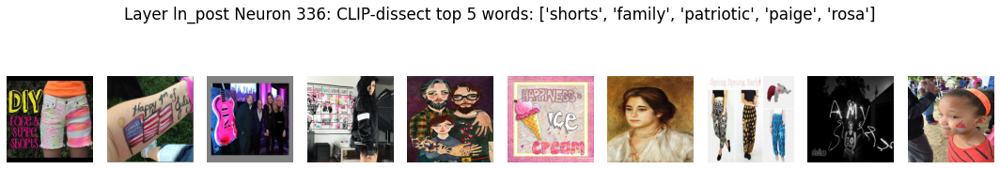

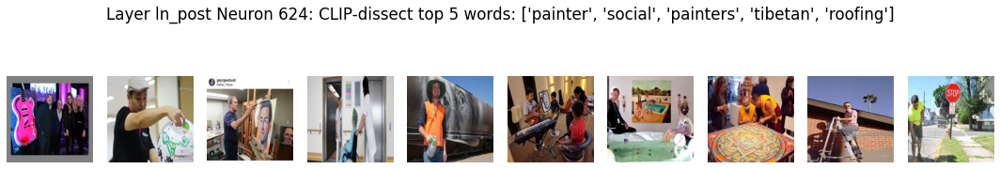

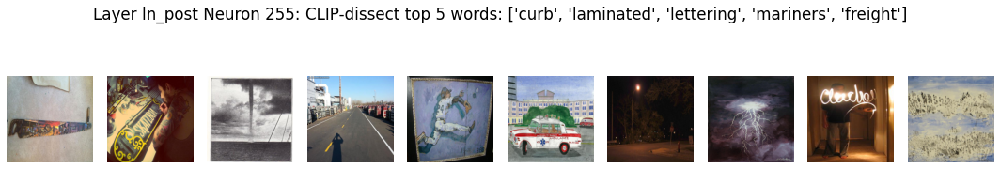

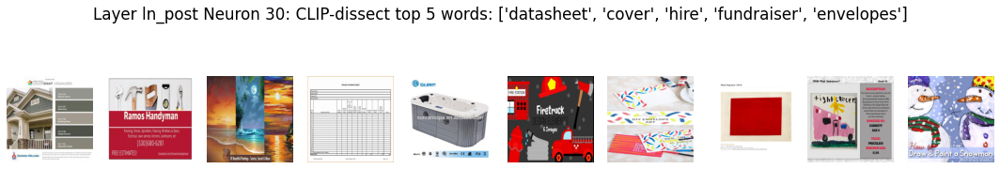

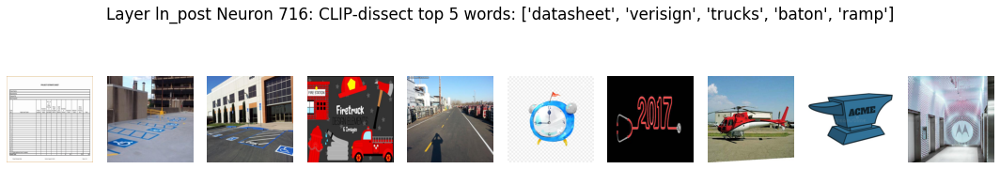

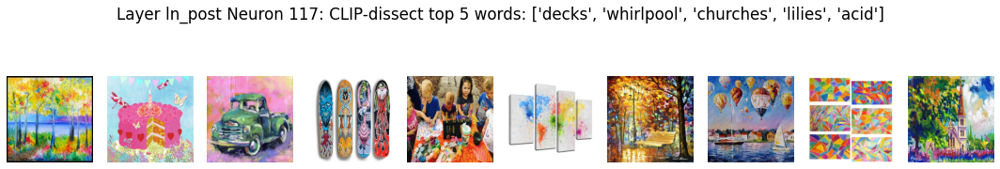

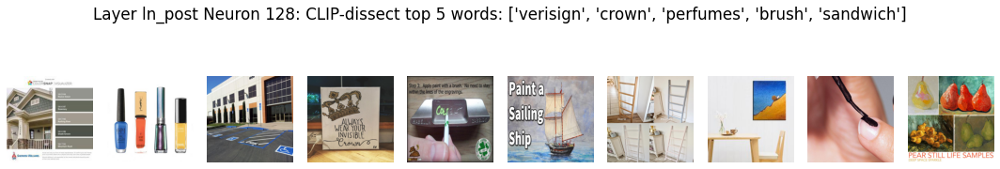

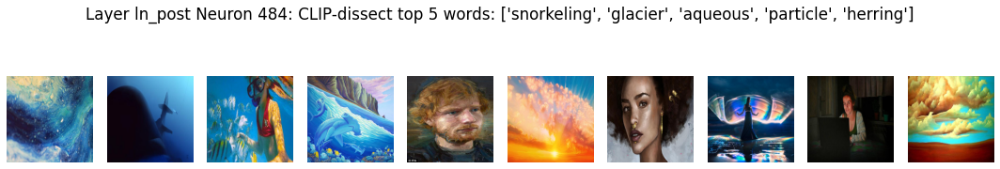

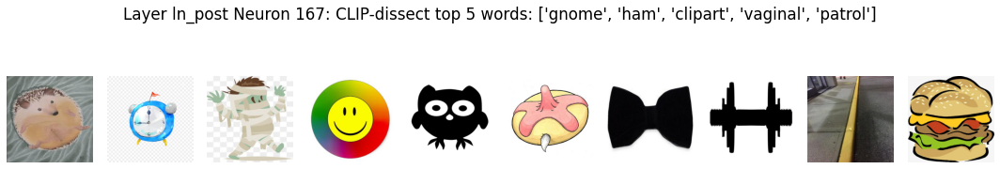

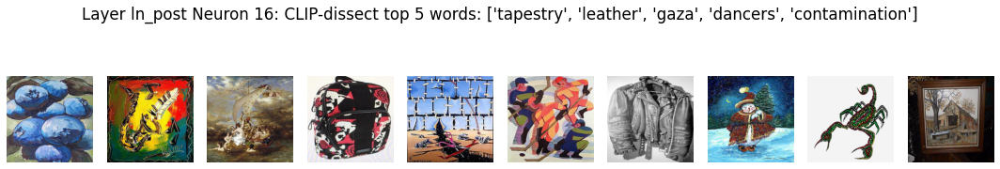


#############################################

Neuron 336: [('face', 6.5782470703125), ('sweater', 6.024993896484375), ('hardback', 4.177581787109375), ('sweaters', 3.85614013671875), ('hardcover', 3.802154541015625)]
Neuron 624: [('roofing', 6.40386962890625), ('handbag', 5.858428955078125), ('hospital', 5.6812744140625), ('leg', 5.595306396484375), ('bus', 5.536712646484375)]
Neuron 255: [('buses', 4.95977783203125), ('bridging', 3.85308837890625), ('getaways', 3.597991943359375), ('cyberspace', 3.37103271484375), ('cushion', 2.958984375)]
Neuron 30: [('spreadsheet', 3.925537109375), ('cassettes', 3.78656005859375), ('dewalt', 3.658660888671875), ('sheet', 3.480499267578125), ('belts', 3.389129638671875)]
Neuron 716: [('docbook', 6.60479736328125), ('bus', 6.222625732421875), ('pool', 5.930328369140625), ('joystick', 5.3883056640625), ('hex', 4.723358154296875)]
Neuron 117: [('scrapbooking', 6.31060791015625), ('notebook', 3.6048583984375), ('hatchback', 3.449615478515625), ('cars',

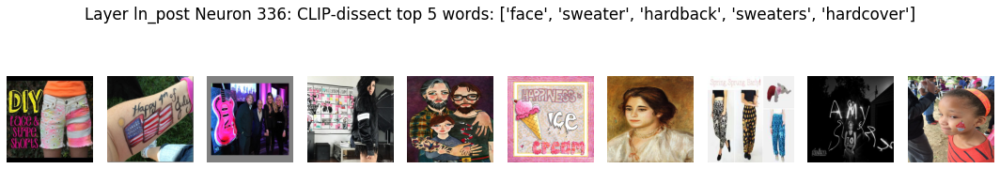

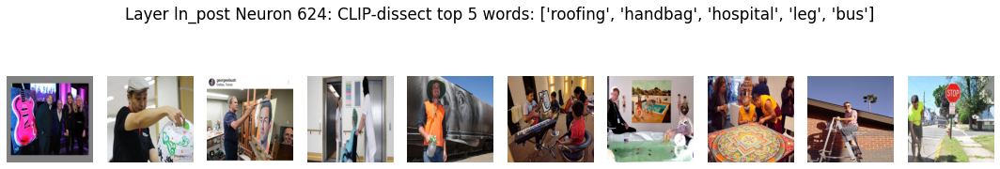

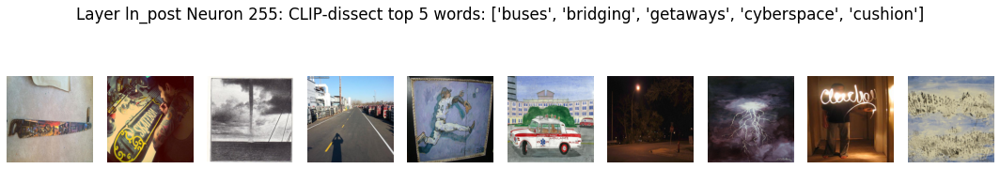

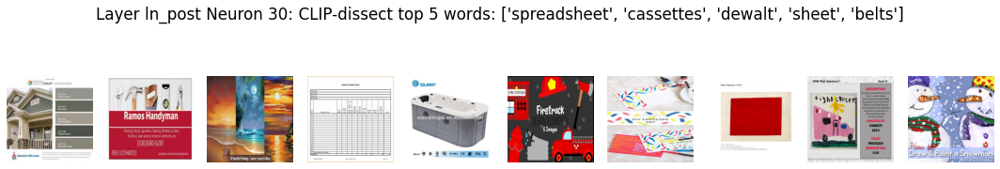

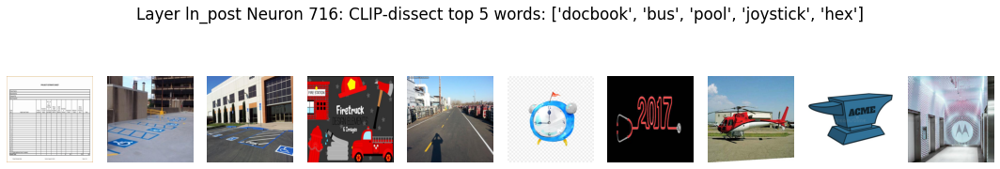

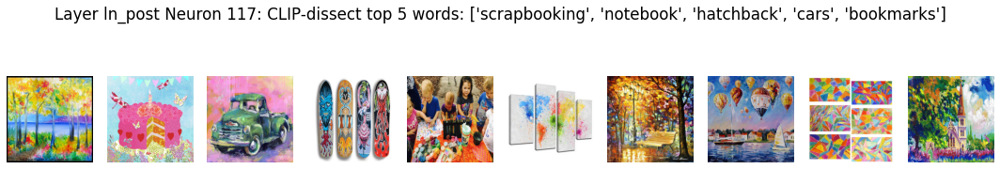

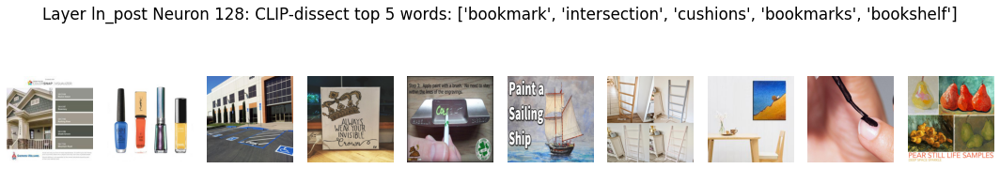

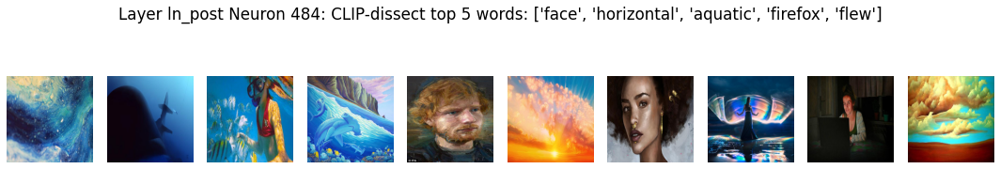

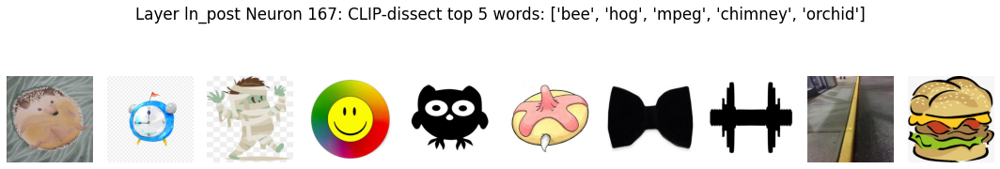

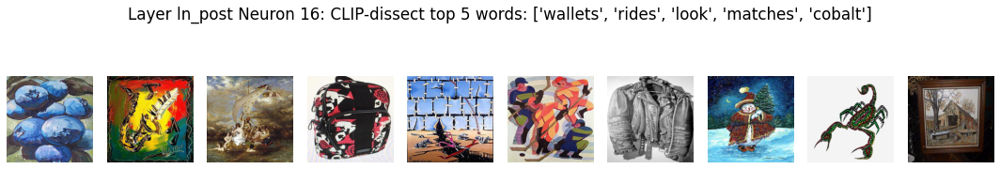

In [8]:
for target_layer in target_layers:
    
    clip_similarities, plumber_similarities, target_activations, pil_data, clip_similarity_matrix = do_CLIP_dissect(d_probe, [target_layer], target_name, device, domain='painting')
    top_neuron_word_frequency, top_neurons = get_top_K_neurons(clip_similarity_matrix, target_activations, clip_similarities, pil_data, K=10, L=5)
    
   
    complete_word_frequency = plot_top_k_concepts_neurons(_, target_activations, similarities=clip_similarities, K=10, L=5, pil_data=pil_data, 
                                                        neurons_to_check=top_neurons, target_layer= target_layer, display=True)

    print('\n#############################################\n')
    top_neuron_word_frequency, top_neurons = get_top_K_neurons(clip_similarity_matrix, target_activations, plumber_similarities, pil_data, K=10, L=5)
        
    complete_word_frequency = plot_top_k_concepts_neurons(_, target_activations, similarities=plumber_similarities, K=10, L=5, pil_data=pil_data, 
                                                        neurons_to_check=top_neurons, target_layer= target_layer, display=True)

## Domain Sketch Painting Clipart

Number of classes in clipart test set: 345
Number of images in clipart test set: 14604

Number of classes in painting test set: 344
Number of images in painting test set: 21850

Number of classes in sketch test set: 345
Number of images in sketch test set: 20916

Number of classes in clipart test set: 345
Number of images in clipart test set: 14604

Number of classes in painting test set: 344
Number of images in painting test set: 21850

Number of classes in sketch test set: 345
Number of images in sketch test set: 20916

Number of classes in clipart test set: 345
Number of images in clipart test set: 14604

Number of classes in painting test set: 344
Number of images in painting test set: 21850

Number of classes in sketch test set: 345
Number of images in sketch test set: 20916

CLIP Image-Text similarity matrix shape: torch.Size([20000, 20000])
Plumber Image-Text similarity matrix shape: torch.Size([20000, 20000])
Target feature matrix shape: torch.Size([20000, 768])


100%|██████████| 768/768 [00:02<00:00, 263.62it/s]


Target Activation-Concept Similarity matrix (CLIP) shape: torch.Size([768, 20000])


100%|██████████| 768/768 [00:02<00:00, 256.27it/s]


Target Activation-Concept Similarity matrix (CLIP) shape: torch.Size([768, 20000])
Neuron 336: [('karate', 4.74664306640625), ('quartet', 4.72174072265625), ('seam', 4.559234619140625), ('saudi', 4.45977783203125), ('bulk', 4.359405517578125)]
Neuron 624: [('contamination', 4.76519775390625), ('award', 4.50677490234375), ('carbs', 4.335723876953125), ('sausage', 4.13629150390625), ('cloud', 3.958740234375)]
Neuron 255: [('natal', 6.1973876953125), ('insects', 6.039276123046875), ('elec', 5.796417236328125), ('pottery', 5.09039306640625), ('insomnia', 4.983184814453125)]
Neuron 167: [('sofa', 5.78521728515625), ('watercolor', 5.71661376953125), ('dallas', 4.997802734375), ('pineapple', 4.631683349609375), ('keyboard', 4.556182861328125)]
Neuron 117: [('hockey', 5.256805419921875), ('pdfs', 4.9404296875), ('contests', 4.750946044921875), ('cinnamon', 4.42120361328125), ('sol', 4.165252685546875)]
Neuron 30: [('pupil', 5.654510498046875), ('oils', 5.333282470703125), ('leopard', 5.1298828

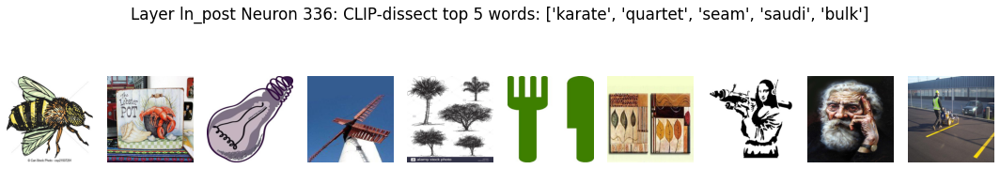

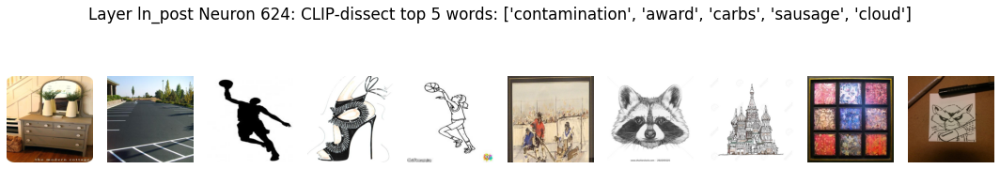

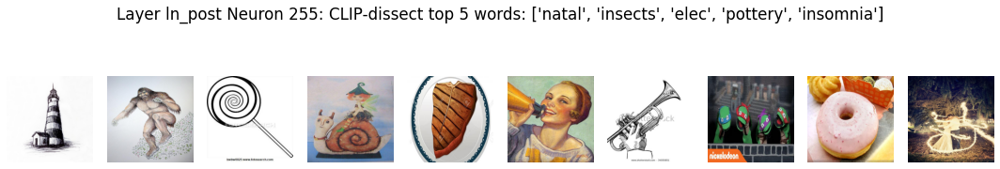

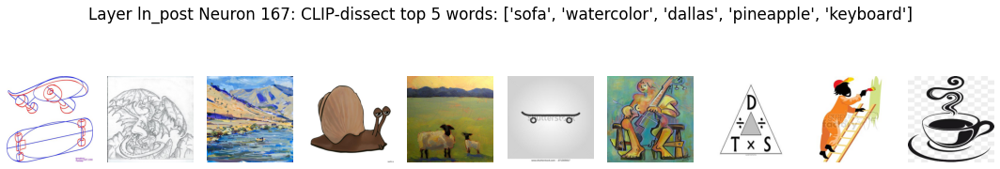

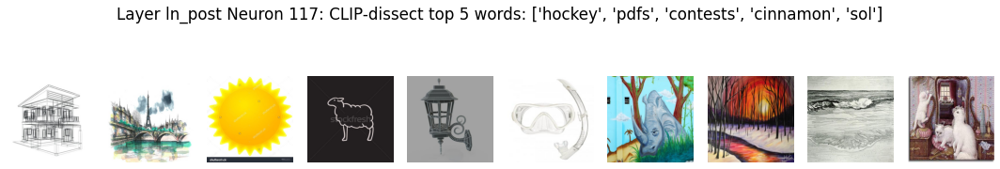

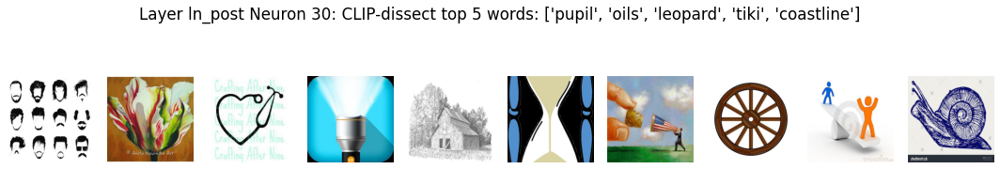

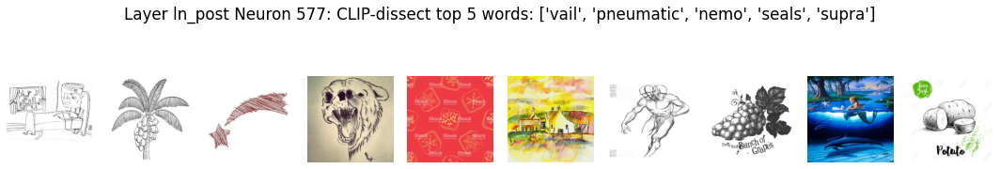

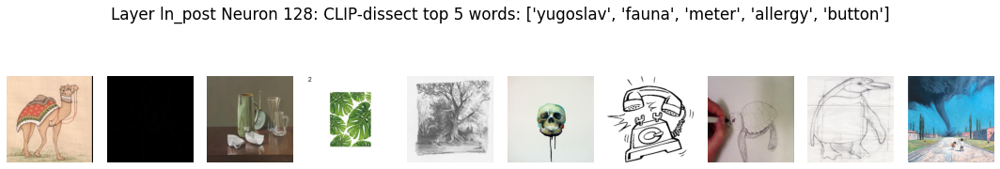

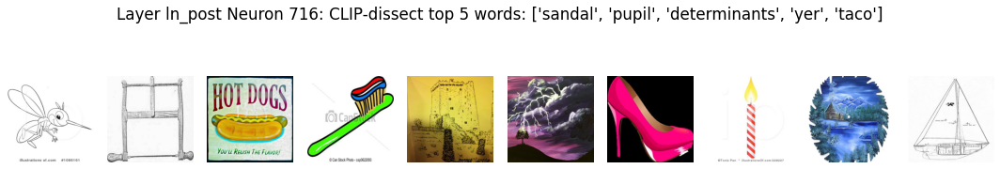

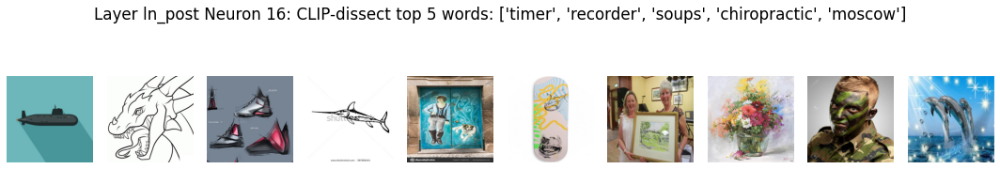


#############################################

Neuron 336: [('pin', 6.57427978515625), ('author', 6.340576171875), ('legs', 6.07818603515625), ('limousine', 3.932403564453125), ('nursing', 3.525299072265625)]
Neuron 624: [('cellphone', 6.6260986328125), ('thumbzilla', 6.518798828125), ('hotline', 6.51171875), ('layup', 6.4764404296875), ('hospital', 6.36187744140625)]
Neuron 255: [('genres', 6.608184814453125), ('reactor', 6.5699462890625), ('sterile', 6.31024169921875), ('citizenship', 4.12255859375), ('console', 4.122314453125)]
Neuron 167: [('breast', 6.64373779296875), ('geoffrey', 5.848419189453125), ('music', 4.851409912109375), ('read', 4.721771240234375), ('potato', 3.82281494140625)]
Neuron 117: [('purse', 6.6407470703125), ('pot', 6.52264404296875), ('passport', 5.431884765625), ('locator', 4.101531982421875), ('markers', 4.009613037109375)]
Neuron 30: [('spreadsheet', 6.643798828125), ('datasheet', 6.643798828125), ('checkboxes', 6.643798828125), ('spreadsheets', 6.64379882

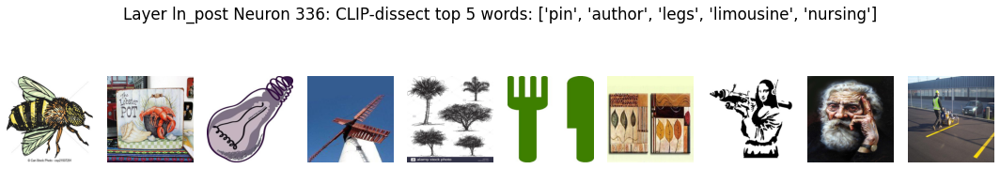

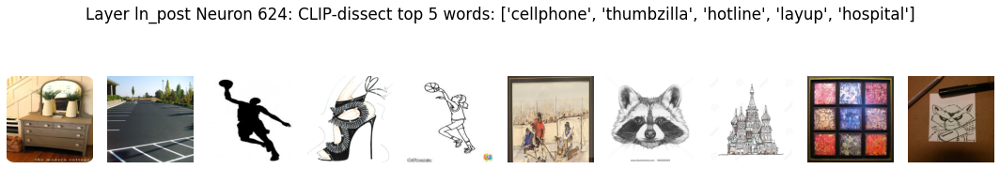

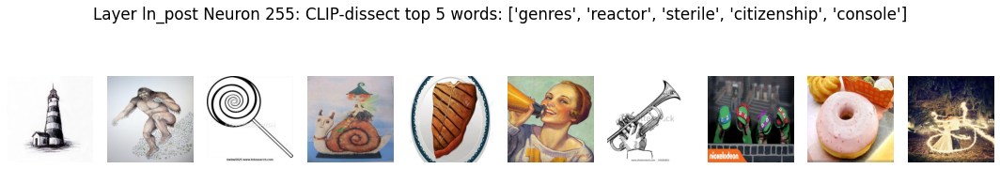

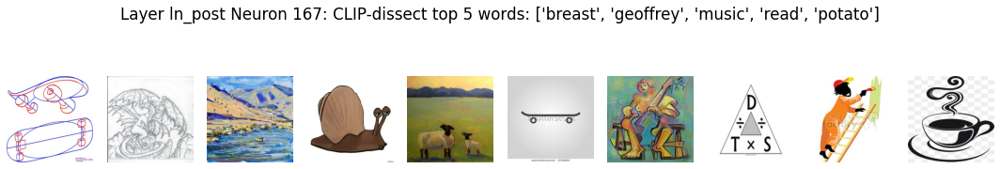

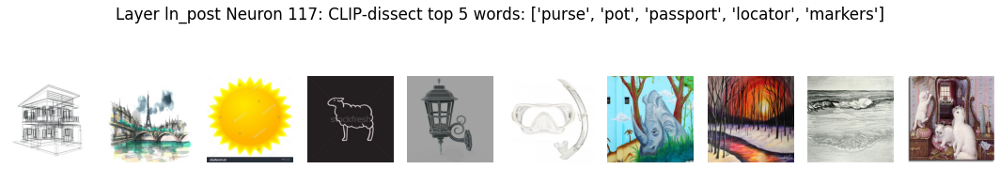

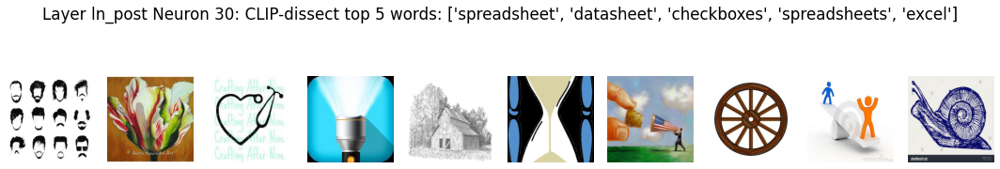

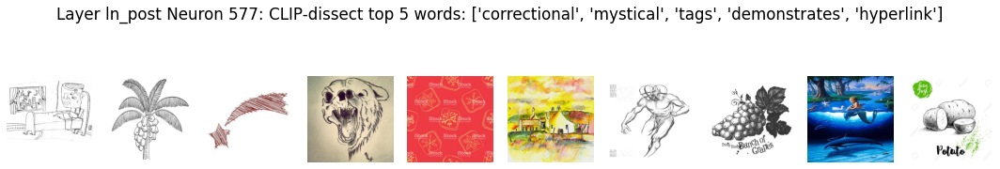

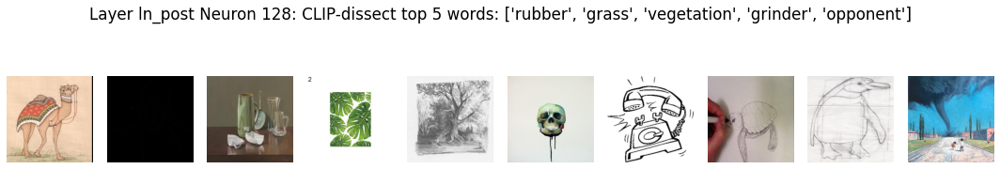

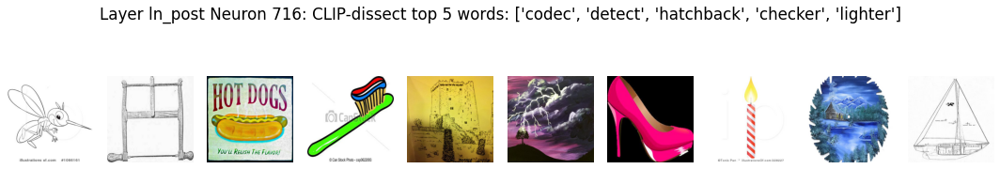

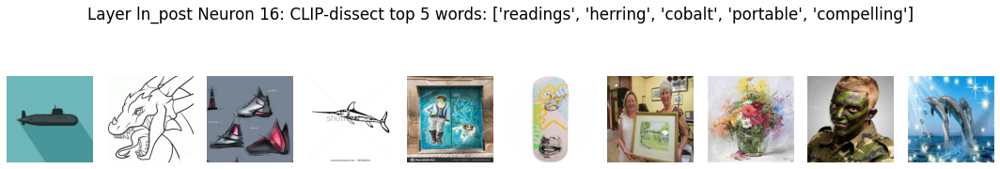

In [9]:
for target_layer in target_layers:
    
    clip_similarities, plumber_similarities, target_activations, pil_data, clip_similarity_matrix = do_CLIP_dissect(d_probe, [target_layer], target_name, device, domain='spc')
    top_neuron_word_frequency, top_neurons = get_top_K_neurons(clip_similarity_matrix, target_activations, clip_similarities, pil_data, K=10, L=5)
    
   
    complete_word_frequency = plot_top_k_concepts_neurons(_, target_activations, similarities=clip_similarities, K=10, L=5, pil_data=pil_data, 
                                                        neurons_to_check=top_neurons, target_layer= target_layer, display=True)

    print('\n#############################################\n')
    top_neuron_word_frequency, top_neurons = get_top_K_neurons(clip_similarity_matrix, target_activations, plumber_similarities, pil_data, K=10, L=5)
        
    complete_word_frequency = plot_top_k_concepts_neurons(_, target_activations, similarities=plumber_similarities, K=10, L=5, pil_data=pil_data, 
                                                        neurons_to_check=top_neurons, target_layer= target_layer, display=True)

In [10]:
import clip

clip_model, clip_preprocess = clip.load("ViT-B/32", device=device)

print(clip_model.visual.transformer.resblocks)

Sequential(
  (0): ResidualAttentionBlock(
    (attn): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
    )
    (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (mlp): Sequential(
      (c_fc): Linear(in_features=768, out_features=3072, bias=True)
      (gelu): QuickGELU()
      (c_proj): Linear(in_features=3072, out_features=768, bias=True)
    )
    (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
  (1): ResidualAttentionBlock(
    (attn): MultiheadAttention(
      (out_proj): NonDynamicallyQuantizableLinear(in_features=768, out_features=768, bias=True)
    )
    (ln_1): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
    (mlp): Sequential(
      (c_fc): Linear(in_features=768, out_features=3072, bias=True)
      (gelu): QuickGELU()
      (c_proj): Linear(in_features=3072, out_features=768, bias=True)
    )
    (ln_2): LayerNorm((768,), eps=1e-05, elementwise_affine=True)
  )
